In [1]:
import os
import numpy as np
import keras
from keras import layers
from tensorflow import data as tf_data
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
import shutil
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt

In [2]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/

!chmod 600 /root/.kaggle/kaggle.json
!pip install kaggle




In [3]:
!kaggle datasets download -d mdwaquarazam/agricultural-crops-image-classification


Dataset URL: https://www.kaggle.com/datasets/mdwaquarazam/agricultural-crops-image-classification
License(s): CC0-1.0
 92% 73.0M/79.0M [00:00<00:00, 90.2MB/s]
100% 79.0M/79.0M [00:00<00:00, 86.0MB/s]


In [4]:
!unzip agricultural-crops-image-classification.zip -d ./agricultural_crops

Archive:  agricultural-crops-image-classification.zip
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image15.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image16.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image17.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image18.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image20.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image21.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image22.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image24.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image25.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image27.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image28.jpeg  
  inflating: ./agricultural_crops/Agricultural-crops/Cherry/image29.jpeg  
  inflating: ./agricultural_crops/Agricultural

In [5]:
!ls

agricultural_crops  agricultural-crops-image-classification.zip  sample_data


In [6]:
!ls -R ./agricultural_crops


./agricultural_crops:
Agricultural-crops

./agricultural_crops/Agricultural-crops:
 almond     coconut	        jowar	      papaya		     sunflower
 banana     Coffee-plant        jute	     'Pearl_millet(bajra)'   tea
 cardamom   cotton	        Lemon	      pineapple		     Tobacco-plant
 Cherry     Cucumber	        maize	      rice		     tomato
 chilli    'Fox_nut(Makhana)'   mustard-oil   soyabean		    'vigna-radiati(Mung)'
 clove	    gram	        Olive-tree    sugarcane		     wheat

./agricultural_crops/Agricultural-crops/almond:
'image (10).jpg'  'image (15).jpg'  'image (1).png'  'image (4).jpg'  'image (9).jpg'
'image (11).jpg'  'image (16).jpg'  'image (2).jpg'  'image (5).jpg'
'image (12).jpg'  'image (17).jpg'  'image (2).png'  'image (6).jpg'
'image (13).jpg'  'image (18).jpg'  'image (3).jpg'  'image (7).jpg'
'image (14).jpg'  'image (1).jpg'   'image (3).png'  'image (8).jpg'

./agricultural_crops/Agricultural-crops/banana:
'image (10).jpg'  'image (17).jpg'  'image (22).jpg'  

In [7]:
base_folder = './agricultural_crops'

class_names = [d for d in os.listdir(base_folder) if os.path.isdir(os.path.join(base_folder, d))]

print("Class names:", class_names)


Class names: ['Agricultural-crops']


Setup: Create subset of images
Clean: Remove any bad images
Create DataLoader: Use tf.keras.preprocessing.image_dataset_from_directory if images are in subdirectories
Visualize Data: Ensure the data is loaded correctly
Create Module: Package data loading and preprocessing functions into a reusable module.

In [8]:
base_folder = './agricultural_crops/Agricultural-crops'
try:
    contents = os.listdir(base_folder)
    print("Contents of the base folder:", contents)
except FileNotFoundError as e:
    print(f"Error: {e}")


Contents of the base folder: ['Cherry', 'almond', 'Cucumber', 'pineapple', 'maize', 'Coffee-plant', 'Olive-tree', 'tea', 'Lemon', 'Tobacco-plant', 'sugarcane', 'sunflower', 'papaya', 'tomato', 'clove', 'mustard-oil', 'chilli', 'cardamom', 'vigna-radiati(Mung)', 'coconut', 'wheat', 'Fox_nut(Makhana)', 'soyabean', 'rice', 'cotton', 'jute', 'banana', 'Pearl_millet(bajra)', 'gram', 'jowar']


In [9]:
base_folder = './agricultural_crops/Agricultural-crops'

subset_folder = 'subset_dataset'
os.makedirs(subset_folder, exist_ok=True)

classes = ['Cherry', 'banana', 'coconut', 'chilli', 'Cucumber']
print(classes)

['Cherry', 'banana', 'coconut', 'chilli', 'Cucumber']


In [10]:
image_size = (224, 224)
batch_size = 10

train_ds, val_ds = tf.keras.utils.image_dataset_from_directory(
    base_folder,
    validation_split=0.2,
    subset="both",
    seed=1337,
    image_size=image_size,
    batch_size=batch_size,
)


Found 829 files belonging to 30 classes.
Using 664 files for training.
Using 165 files for validation.


In [12]:
def create_subset(base_folder, classes, max_images_per_class=100):
    subset_folder = 'subset_dataset'
    os.makedirs(subset_folder, exist_ok=True)

    for folder_name in classes:
        src_folder = os.path.join(base_folder, folder_name)
        dest_folder = os.path.join(subset_folder, folder_name)
        os.makedirs(dest_folder, exist_ok=True)

        if not os.path.exists(src_folder):
            print(f"Source folder not found: {src_folder}")
            continue

        images = os.listdir(src_folder)
        for i, fname in enumerate(images):
            if i >= max_images_per_class:
                break
            src_file = os.path.join(src_folder, fname)
            dest_file = os.path.join(dest_folder, fname)
            shutil.copy(src_file, dest_file)


classes = ['Cherry', 'banana', 'coconut', 'chilli', 'Cucumber']
create_subset(base_folder, classes)


In [13]:
def remove_small_images(base_folder, min_size=(100, 100)):
    num_removed = 0
    for folder_name in os.listdir(base_folder):
        folder_path = os.path.join(base_folder, folder_name)
        if os.path.isdir(folder_path):
            for fname in os.listdir(folder_path):
                fpath = os.path.join(folder_path, fname)
                if os.path.isfile(fpath):
                    try:
                        with Image.open(fpath) as img:
                            width, height = img.size
                            if width < min_size[0] or height < min_size[1]:
                                os.remove(fpath)
                                num_removed += 1
                    except Exception as e:
                        print(f"Cannot open {fname}: {e}")
    print(f"Total images removed: {num_removed}")

remove_small_images('agricultural_crops')


Total images removed: 0


In [14]:
batch_size = 10
img_height = 224
img_width = 224

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    subset_folder,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    subset_folder,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)



Found 142 files belonging to 5 classes.
Using 114 files for training.
Found 142 files belonging to 5 classes.
Using 28 files for validation.


In [18]:
  # data_loader.py
def create_subset(base_folder, classes, max_images_per_class=100):
    subset_folder = 'subset_dataset'
    os.makedirs(subset_folder, exist_ok=True)

    for folder_name in classes:
        src_folder = os.path.join(base_folder, folder_name)
        dest_folder = os.path.join(subset_folder, folder_name)
        os.makedirs(dest_folder, exist_ok=True)

        if not os.path.exists(src_folder):
            print(f"Source folder not found: {src_folder}")
            continue

        images = os.listdir(src_folder)
        for i, fname in enumerate(images):
            if i >= max_images_per_class:
                break
            src_file = os.path.join(src_folder, fname)
            dest_file = os.path.join(dest_folder, fname)
            shutil.copy(src_file, dest_file)

def load_dataset(subset_folder, img_height=180, img_width=180, batch_size=32):
    train_ds = tf.keras.preprocessing.image_dataset_from_directory(
        subset_folder,
        validation_split=0.2,
        subset="training",
        seed=123,
        image_size=(img_height, img_width),
        batch_size=batch_size
    )

    val_ds = tf.keras.preprocessing.image_dataset_from_directory(
        subset_folder,
        validation_split=0.2,
        subset="validation",
        seed=123,
        image_size=(img_height, img_width),
        batch_size=batch_size
    )

    return train_ds, val_ds


In [17]:
data_augmentation = tf.keras.Sequential([ #applying a bunch of transformations in order
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomContrast(0.1)                                      #for rotational variability to help learning?
])

augmented_train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))
#train_ds.map applies a function to each element, train_ds being TF that contains images and lables, and then the rest changes images 'x' without changing labels 'y'

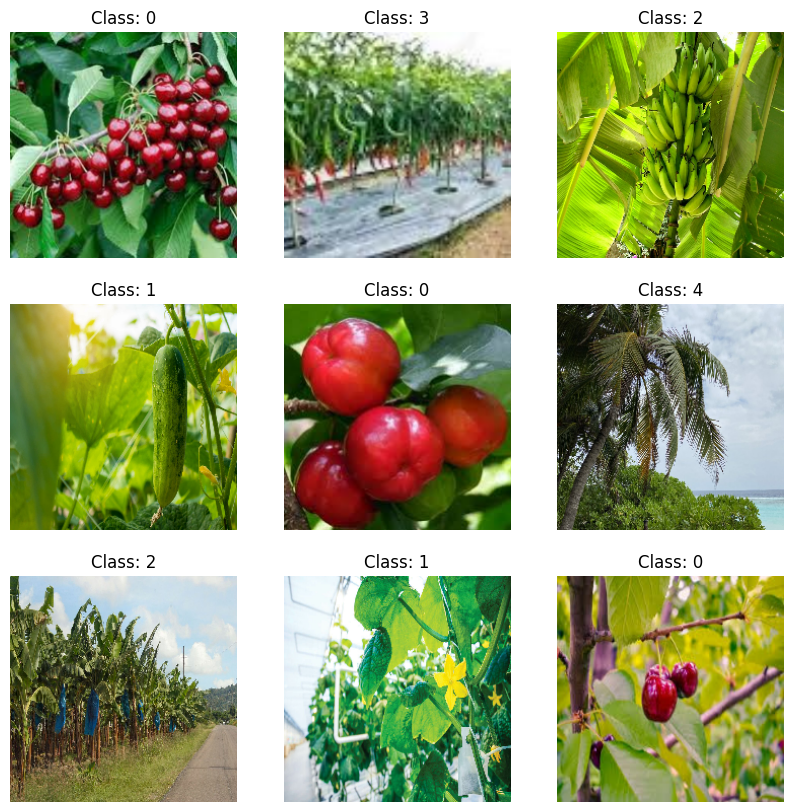

In [19]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Class: {labels[i].numpy()}")
        plt.axis("off")
plt.show()


In [20]:
# Apply `data_augmentation` to the training images.
train_ds = train_ds.map(
    lambda img, label: (data_augmentation(img), label),
    num_parallel_calls=tf_data.AUTOTUNE,
)
# Prefetching samples in GPU memory helps maximize GPU utilization.
train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
val_ds = val_ds.prefetch(tf_data.AUTOTUNE)

In [21]:
def visualize(dataset, augmented=False):
    plt.figure(figsize=(10, 10))
    for images, labels in dataset.take(1):
        if augmented:
            images = data_augmentation(images)  #this is the data augmentation function possibility
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(int(labels[i]))
            plt.axis("off")
    plt.show()###this function can show augmented and unaugmented

Original Images:


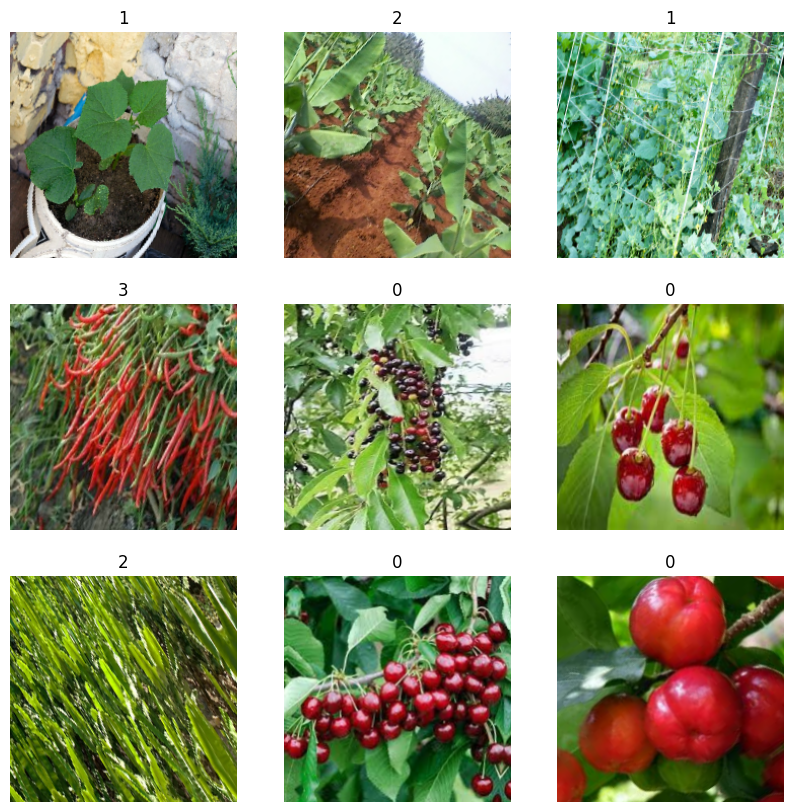

Augmented Images:


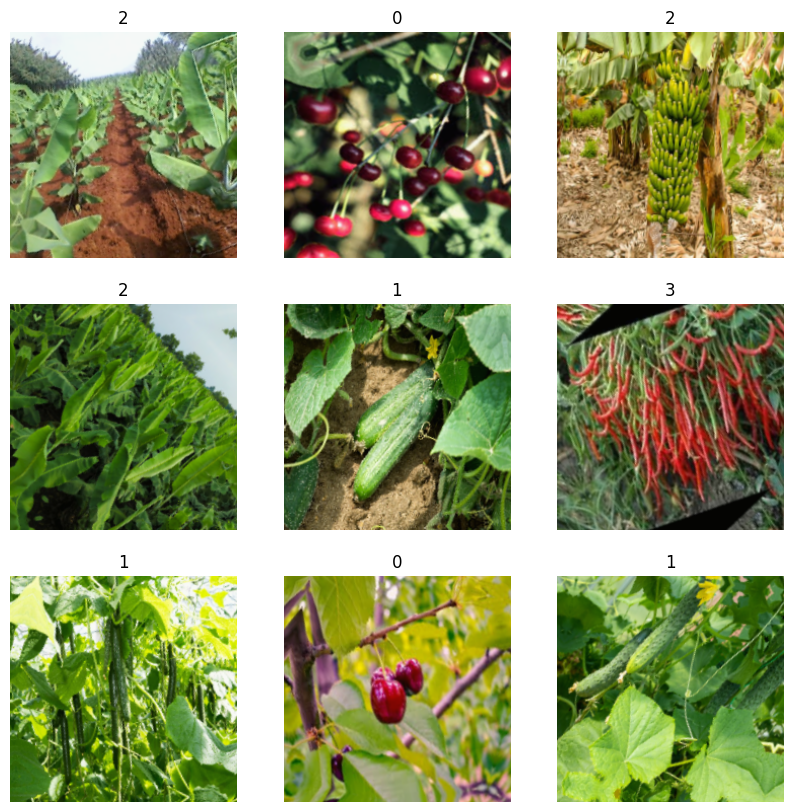

In [22]:
print("Original Images:")
visualize(train_ds, augmented=False)

print("Augmented Images:")
visualize(train_ds, augmented=True)

In [23]:
def make_model(input_shape, num_classes):
    inputs = keras.Input(shape=input_shape)#input_shape is a tuple specifying the shape of the input images

    # Entry block
    x = layers.Rescaling(1.0 / 255)(inputs) #Scales pixel values to the range [0, 1]
    x = layers.Conv2D(128, 3, strides=2, padding="same")(x) #Applies a convolutional layer with 128 filters, a kernel size of 3x3, a stride of 2, and 'same' padding.
    x = layers.BatchNormalization()(x)#layers.BatchNormalization(): Normalizes the output of the convolutional layer.
    x = layers.Activation("relu")(x)#layers.Activation("relu"): Applies the ReLU activation function

    previous_block_activation = x  # Set aside residual

    for size in [256, 512, 728]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(size, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(size, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(size, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    x = layers.SeparableConv2D(1024, 3, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.GlobalAveragePooling2D()(x)
    if num_classes == 2:
        units = 1
    else:
        units = num_classes

    x = layers.Dropout(0.25)(x)
    # We specify activation=None so as to return logits
    outputs = layers.Dense(units, activation=None)(x)
    return keras.Model(inputs, outputs)


model = make_model(input_shape=image_size + (3,), num_classes=2)
#keras.utils.plot_model(model, show_shapes=True)

In [24]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

epochs = 8
callbacks = [
    keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]

model.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[keras.metrics.BinaryAccuracy(name="acc")],
)

# Train the model
history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=val_ds,
)


Epoch 1/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 127s 10s/step - acc: 0.2333 - loss: -1.2130 - val_acc: 0.0714 - val_loss: 0.5479
Epoch 2/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 114s 9s/step - acc: 0.2686 - loss: -5.7417 - val_acc: 0.0714 - val_loss: 0.3944
Epoch 3/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 114s 9s/step - acc: 0.2092 - loss: -10.4237 - val_acc: 0.0714 - val_loss: 0.2636
Epoch 4/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 151s 10s/step - acc: 0.3298 - loss: -13.1110 - val_acc: 0.0714 - val_loss: 0.1070
Epoch 5/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 136s 10s/step - acc: 0.3502 - loss: -20.5487 - val_acc: 0.0714 - val_loss: -0.0781
Epoch 6/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 141s 10s/step - acc: 0.3198 - loss: -22.0214 - val_acc: 0.2500 - val_loss: -0.2676
Epoch 7/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 141s 10s/step - acc: 0.4118 - loss: -20.5631 - val_acc: 0.2500 - val_loss: -0.3406
Epoch 8/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 121s 10s/step - acc: 0.3605 - loss: -30.9423 - val_acc: 0.2500 - val_loss: -0.5800


#Validation accuracy remains constant at 7.14%, which means that it's not really improving, the val loss eventually becomes negative which is unusual and not what we want to see out of training this model

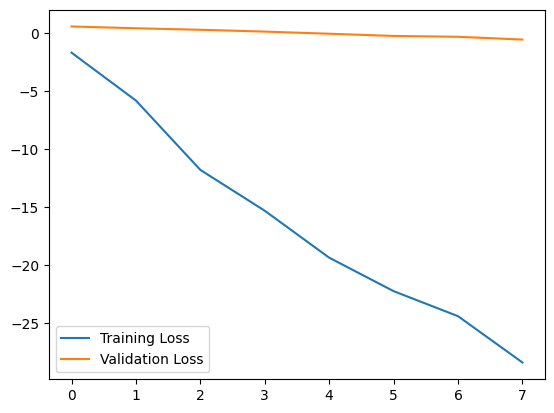

In [25]:
plt.plot(range(len(history.history["loss"])),history.history["loss"],label="Training Loss")
plt.plot(range(len(history.history["val_loss"])),history.history["val_loss"],label="Validation Loss")
plt.legend()

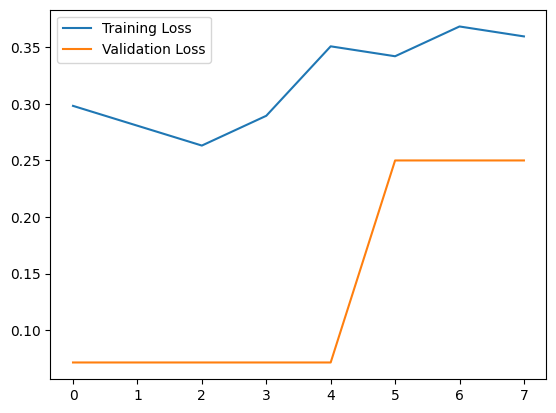

In [26]:
plt.plot(range(len(history.history["acc"])),history.history["acc"],label="Training Loss")
plt.plot(range(len(history.history["val_acc"])),history.history["val_acc"],label="Validation Loss")
plt.legend()

#HHHHHHHHHHHHHH

Found 829 files belonging to 1 classes.
Using 664 files for training.
Using 165 files for validation.


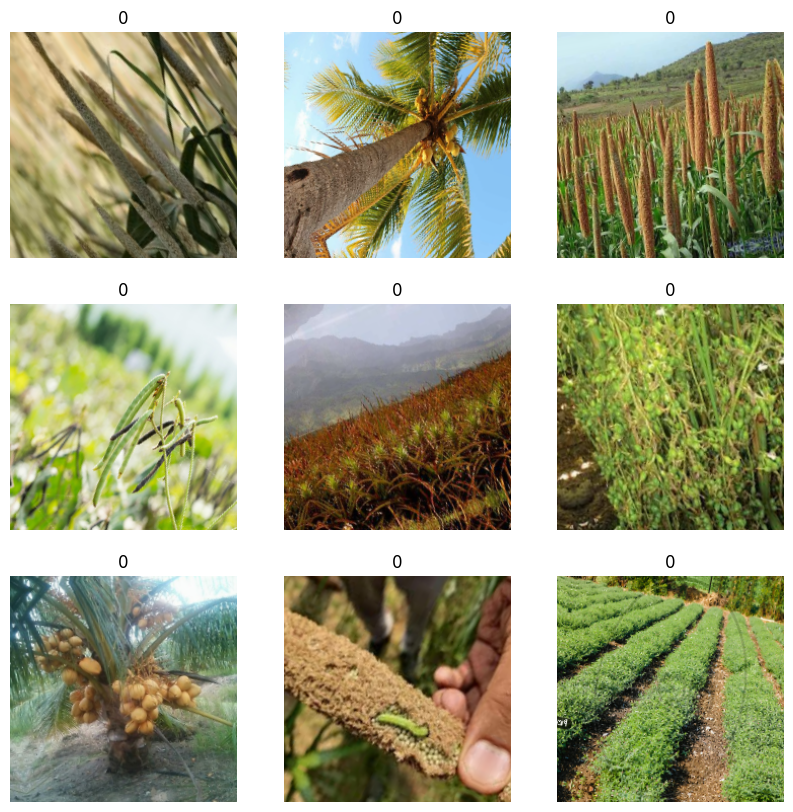

In [27]:
#already did this earlier
image_size = (224, 224)
batch_size = 10

def load_and_preprocess_data(base_folder):
    train_ds, val_ds = tf.keras.utils.image_dataset_from_directory(#loads ds from directory 'base_folder; and then splits it into training and validation set
        base_folder,
        validation_split=0.2,
        subset="both",
        seed=1337,#concerened with reproducibility of the split
        image_size=image_size,
        batch_size=batch_size,
    )

    data_augmentation_layers = [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomContrast(0.1),
    ]

    def data_augmentation(images):
        for layer in data_augmentation_layers:
            images = layer(images)
        return images

#already did this, prefetching
    train_ds = train_ds.map(
        lambda img, label: (data_augmentation(img), label),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
    val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

    return train_ds, val_ds

def visualize(dataset):
    plt.figure(figsize=(10, 10))
    for images, labels in dataset.take(1):
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(int(labels[i]))
            plt.axis("off")

train_ds, val_ds = load_and_preprocess_data('./agricultural_crops')
visualize(train_ds)


#match a to a

In [28]:
def make_transfer_model(input_shape, num_classes):
    # Load the pre-trained weights of MobileNetV2 and freeze the weights
    backbone = keras.applications.MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
    )
    backbone.trainable = False

    inputs = layers.Input(shape=input_shape)
    x = keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)

    x = layers.GlobalAveragePooling2D()(x)
    if num_classes == 2:
        units = 1
    else:
        units = num_classes

    x = layers.Dropout(0.25)(x)
    # We specify activation=None so as to return logits
    outputs = layers.Dense(units, activation=None)(x)

    return keras.Model(inputs, outputs, name="classifier")

# Create the model
model = make_transfer_model(input_shape=image_size + (3,), num_classes=2)
model.summary()


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide (TrueDivide)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract (Subtract)                  │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 7, 7, 1280)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │           1,281 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

#redid this down below, ignore

In [29]:
import os
from PIL import Image

def remove_invalid_files(base_folder):
    for root, dirs, files in os.walk(base_folder):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                img = Image.open(file_path)  # Try to open the file as an image
                img.verify()  # Verify that it is, in fact, an image
            except (IOError, SyntaxError) as e:
                print(f'Removing invalid file: {file_path}')
                os.remove(file_path)  # Remove the file if it's not a valid image

remove_invalid_files('./agricultural_crops')


In [30]:
def make_transfer_model(input_shape, num_classes):
    # Load the pre-trained weights of MobileNetV2 and freeze the weights
    backbone = keras.applications.MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
    )
    backbone.trainable = False

    inputs = layers.Input(input_shape)
    x = keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)

    x = layers.GlobalAveragePooling2D()(x)
    if num_classes == 2:
        units = 1
    else:
        units = num_classes

    x = layers.Dropout(0.25)(x)
    # We specify activation=None so as to return logits
    outputs = layers.Dense(units, activation=None)(x)

    return keras.Model(inputs, outputs, name="keypoint_detector")

In [31]:
model2 = make_transfer_model(input_shape=image_size + (3,), num_classes=2)

In [32]:
epochs = 8

callbacks = [
    keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]
model2.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[keras.metrics.BinaryAccuracy(name="acc")],
)

history = model2.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=val_ds,
)

Epoch 1/8
 6/67 ━━━━━━━━━━━━━━━━━━━━ 23s 389ms/step - acc: 0.7272 - loss: 0.8628

InvalidArgumentError: Graph execution error:

Detected at node decode_image/DecodeImage defined at (most recent call last):
<stack traces unavailable>
Unknown image file format. One of JPEG, PNG, GIF, BMP required.
	 [[{{node decode_image/DecodeImage}}]]
	 [[IteratorGetNext]] [Op:__inference_one_step_on_iterator_25455]

#removing invalid file types

In [75]:
import os
import imghdr

def print_image_file_types(base_folder):
    for root, dirs, files in os.walk(base_folder):
        for file in files:
            file_path = os.path.join(root, file)
            file_type = imghdr.what(file_path)
            if file_type:
                print(f'File: {file_path}, Type: {file_type}')
            else:
                print(f'File: {file_path}, Type: Unknown')

print_image_file_types('./agricultural_crops')


File: ./agricultural_crops/Agricultural-crops/jowar/image (16).jpg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (6).jpg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (10).jpeg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (9).jpeg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (17).jpg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (10).jpg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (12).jpg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (14).jpg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (19).jpg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (9).jpg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (8).jpg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/image (4).jpg, Type: jpeg
File: ./agricultural_crops/Agricultural-crops/jowar/ima

In [76]:
import os
import imghdr

def remove_unknown_image_files(base_folder):
    for root, dirs, files in os.walk(base_folder):
        for file in files:
            file_path = os.path.join(root, file)
            file_type = imghdr.what(file_path)
            if not file_type:
                print(f'Removing invalid file: {file_path}')
                os.remove(file_path)  # Remove the file if its type is unknown

remove_unknown_image_files('./agricultural_crops')


Removing invalid file: ./agricultural_crops/Agricultural-crops/jowar/image (3).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/cotton/image (12).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/cotton/image (7).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/coconut/image (14).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/coconut/image (8).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/jute/image (18).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/banana/image (12).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/banana/image (8).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/banana/image (11).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/banana/image (13).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/wheat/image (46).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/Olive-tr

#restarting transfer model 1

In [33]:
import os
import shutil

base_folder = './agricultural_crops/Agricultural-crops'
subset_folder = './agricultural_crops/subset_dataset'
classes = ['Cherry', 'banana', 'coconut', 'chilli', 'Cucumber']


os.makedirs(subset_folder, exist_ok=True)

for class_name in classes:
    class_path = os.path.join(base_folder, class_name)
    subset_class_path = os.path.join(subset_folder, class_name)
    if os.path.exists(class_path):
        shutil.copytree(class_path, subset_class_path)
    else:
        print(f'Class {class_name} not found in the base folder.')


Found 142 files belonging to 5 classes.
Using 114 files for training.
Found 142 files belonging to 5 classes.
Using 28 files for validation.


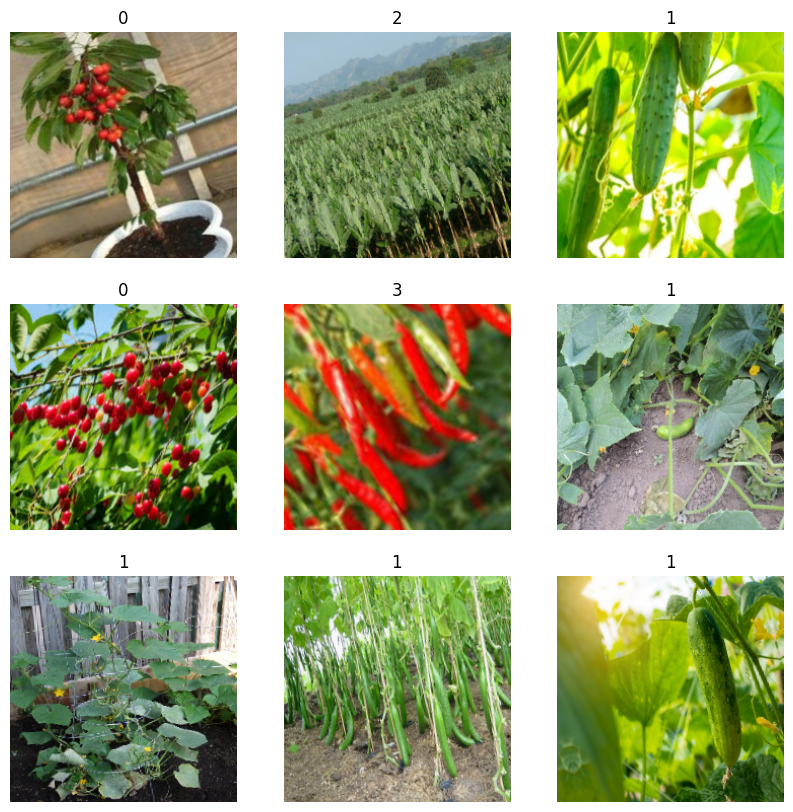

In [34]:
#image and batch size again
image_size = (224, 224)
batch_size = 10

def load_and_preprocess_data(base_folder):
    train_ds = tf.keras.utils.image_dataset_from_directory(
        base_folder,
        validation_split=0.2,
        subset="training",
        seed=1337,
        image_size=image_size,
        batch_size=batch_size,
    )
    val_ds = tf.keras.utils.image_dataset_from_directory(
        base_folder,
        validation_split=0.2,
        subset="validation",
        seed=1337,
        image_size=image_size,
        batch_size=batch_size,
    )

#chose these data augmentation layers
    data_augmentation_layers = [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomContrast(0.1),
    ]

    def data_augmentation(images):
        for layer in data_augmentation_layers:
            images = layer(images)
        return images

#this applies it to ds
    train_ds = train_ds.map(
        lambda img, label: (data_augmentation(img), label),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
    val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

    return train_ds, val_ds

def visualize(dataset):
    plt.figure(figsize=(10, 10))
    for images, labels in dataset.take(1):
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(int(labels[i]))
            plt.axis("off")

train_ds, val_ds = load_and_preprocess_data('./agricultural_crops/subset_dataset')
visualize(train_ds)


In [35]:
def make_transfer_model(input_shape, num_classes):
    # Load the pre-trained weights of MobileNetV2 and freeze the weights
    backbone = keras.applications.MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
    )
    backbone.trainable = False

    inputs = layers.Input(input_shape)
    x = keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)

    x = layers.GlobalAveragePooling2D()(x)
    if num_classes == 2:
        units = 1
    else:
        units = num_classes

    x = layers.Dropout(0.25)(x)
    # We specify activation=None so as to return logits
    outputs = layers.Dense(units, activation=None)(x)

    return keras.Model(inputs, outputs, name="keypoint_detector")

input_shape = image_size + (3,)
num_classes = len(classes)
model = make_transfer_model(input_shape, num_classes)

epochs = 8
callbacks = [
    keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]

model.compile(
    optimizer=keras.optimizers.Adam(3e-4),#had to remove legacy
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=val_ds,
)


Epoch 1/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 15s 678ms/step - acc: 0.3426 - loss: 1.9725 - val_acc: 0.2500 - val_loss: 1.8376
Epoch 2/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 550ms/step - acc: 0.3020 - loss: 1.7665 - val_acc: 0.2143 - val_loss: 1.6604
Epoch 3/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 499ms/step - acc: 0.3431 - loss: 1.5177 - val_acc: 0.2857 - val_loss: 1.4727
Epoch 4/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 450ms/step - acc: 0.4406 - loss: 1.3907 - val_acc: 0.5000 - val_loss: 1.2419
Epoch 5/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 605ms/step - acc: 0.5560 - loss: 1.1920 - val_acc: 0.5357 - val_loss: 1.1026
Epoch 6/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 453ms/step - acc: 0.6828 - loss: 0.9400 - val_acc: 0.6786 - val_loss: 0.9671
Epoch 7/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 682ms/step - acc: 0.6588 - loss: 0.9669 - val_acc: 0.6786 - val_loss: 0.8856
Epoch 8/8
12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 500ms/step - acc: 0.8020 - loss: 0.6269 - val_acc: 0.7500 - val_loss: 0.8252


#validation accuracy has reached 80.2%, and the validation loss has dropped to 85.52%. This shows that the model is indeed learning by later epochs

In [36]:
model.summary()

Model: "keypoint_detector"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide_2 (TrueDivide)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract_2 (Subtract)                │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 7, 7, 1280)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 5)                   │           6,405 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,277,201 (8.69 MB)

 Trainable params: 6,405 (25.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 12,812 (50.05 KB)

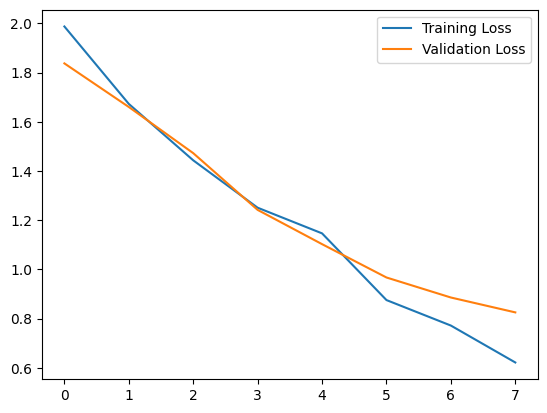

In [37]:
plt.plot(range(len(history.history["loss"])),history.history["loss"],label="Training Loss")
plt.plot(range(len(history.history["val_loss"])),history.history["val_loss"],label="Validation Loss")
plt.legend()

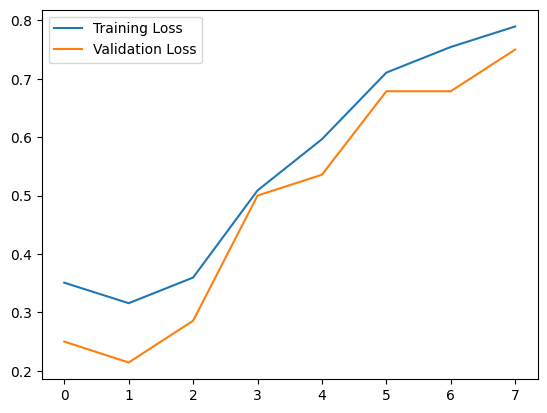

In [38]:
plt.plot(range(len(history.history["acc"])),history.history["acc"],label="Training Loss")
plt.plot(range(len(history.history["val_acc"])),history.history["val_acc"],label="Validation Loss")
plt.legend()

In [39]:
#using keras to save model to /content/ directory using native, not legacy
model.save('/content/my_model.keras')



In [ ]:
# from google.colab import files
# files.download('/content/my_model.keras')
# !ls /content

##this is if i want to reload it

In [43]:
import imghdr

def print_unknown_image_files(base_folder):
    for root, dirs, files in os.walk(base_folder):
        for file in files:
            file_path = os.path.join(root, file)
            file_type = imghdr.what(file_path)
            if not file_type:
                print(f'File with unknown type: {file_path}')

print_unknown_image_files('./agricultural_crops')


File with unknown type: ./agricultural_crops/subset_dataset/Cucumber/image (28).jpg
File with unknown type: ./agricultural_crops/subset_dataset/coconut/image (8).jpg
File with unknown type: ./agricultural_crops/subset_dataset/coconut/image (14).jpg
File with unknown type: ./agricultural_crops/subset_dataset/banana/image (12).jpg
File with unknown type: ./agricultural_crops/subset_dataset/banana/image (13).jpg
File with unknown type: ./agricultural_crops/subset_dataset/banana/image (8).jpg
File with unknown type: ./agricultural_crops/subset_dataset/banana/image (11).jpg
File with unknown type: ./agricultural_crops/Agricultural-crops/almond/image (13).jpg
File with unknown type: ./agricultural_crops/Agricultural-crops/almond/image (9).jpg
File with unknown type: ./agricultural_crops/Agricultural-crops/Cucumber/image (28).jpg
File with unknown type: ./agricultural_crops/Agricultural-crops/maize/image (5).jpg
File with unknown type: ./agricultural_crops/Agricultural-crops/maize/image (12).

In [44]:
def remove_unknown_image_files(base_folder):
    for root, dirs, files in os.walk(base_folder):
        for file in files:
            file_path = os.path.join(root, file)
            file_type = imghdr.what(file_path)
            if not file_type:
                print(f'Removing invalid file: {file_path}')
                os.remove(file_path)  # Remove the file if its type is unknown

remove_unknown_image_files('./agricultural_crops')

Removing invalid file: ./agricultural_crops/subset_dataset/Cucumber/image (28).jpg
Removing invalid file: ./agricultural_crops/subset_dataset/coconut/image (8).jpg
Removing invalid file: ./agricultural_crops/subset_dataset/coconut/image (14).jpg
Removing invalid file: ./agricultural_crops/subset_dataset/banana/image (12).jpg
Removing invalid file: ./agricultural_crops/subset_dataset/banana/image (13).jpg
Removing invalid file: ./agricultural_crops/subset_dataset/banana/image (8).jpg
Removing invalid file: ./agricultural_crops/subset_dataset/banana/image (11).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/almond/image (13).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/almond/image (9).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/Cucumber/image (28).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/maize/image (5).jpg
Removing invalid file: ./agricultural_crops/Agricultural-crops/maize/image (12).jpg
Removing

#match a to a

In [50]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

def make_transfer_model(input_shape, num_classes):
    #so here is where I add the data augmentation
    data_augmentation = keras.Sequential([
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.1),
    ])

    # Load the pre-trained weights of MobileNetV2 and freeze the weights
    backbone = keras.applications.MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
    )
    backbone.trainable = False

    # Create the model architecture
    inputs = layers.Input(shape=input_shape)
    x = data_augmentation(inputs)  #where I apply data agumentation
    x = keras.applications.mobilenet_v2.preprocess_input(x)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)
    x = layers.GlobalAveragePooling2D()(x)

    if num_classes == 2:
        units = 1
    else:
        units = num_classes

    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(units, activation=None)(x)  # Return logits

    return keras.Model(inputs, outputs, name="classifier")

model = make_transfer_model(input_shape=(224, 224, 3), num_classes=2)
model.summary()


Model: "classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_6 (Sequential)            │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide_6 (TrueDivide)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract_6 (Subtract)                │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 7, 7, 1280)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_7           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │           1,281 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

Found 135 files belonging to 5 classes.
Using 108 files for training.
Found 135 files belonging to 5 classes.
Using 27 files for validation.


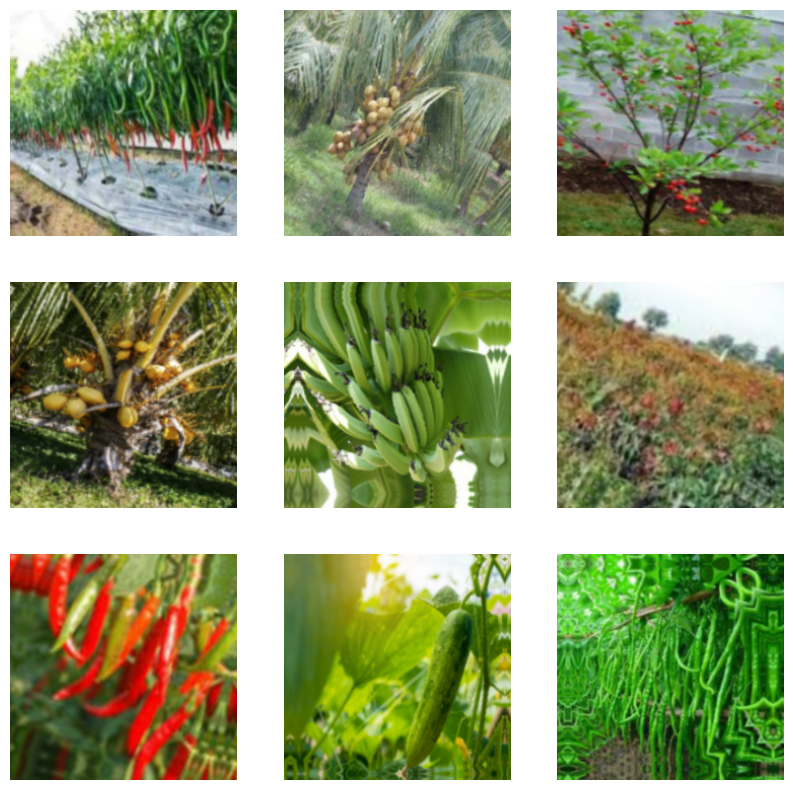

In [54]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

image_size = (224, 224)
batch_size = 10

# Define data augmentation layers
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.15),
])

def load_and_preprocess_data(base_folder):
    # Load dataset
    train_ds = tf.keras.utils.image_dataset_from_directory(
        base_folder,
        validation_split=0.2,
        subset="training",
        seed=1337,
        image_size=image_size,
        batch_size=batch_size,
    )
    val_ds = tf.keras.utils.image_dataset_from_directory(
        base_folder,
        validation_split=0.2,
        subset="validation",
        seed=1337,
        image_size=image_size,
        batch_size=batch_size,
    )

    # Apply data augmentation to the training dataset
    train_ds = train_ds.map(
        lambda img, label: (data_augmentation(img, training=True), label),
        num_parallel_calls=tf.data.AUTOTUNE,
    )

    # Prefetch datasets for performance optimization
    train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
    val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

    return train_ds, val_ds

def visualize_augmented_images(dataset):
    plt.figure(figsize=(10, 10))
    for images, _ in dataset.take(1):
        augmented_images = data_augmentation(images, training=True)
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(augmented_images[i].numpy().astype("uint8"))
            plt.axis("off")

# Load, preprocess, and visualize the dataset
train_ds, val_ds = load_and_preprocess_data('./agricultural_crops/subset_dataset')
visualize_augmented_images(train_ds)


Found 135 files belonging to 5 classes.
Using 108 files for training.
Found 135 files belonging to 5 classes.
Using 27 files for validation.


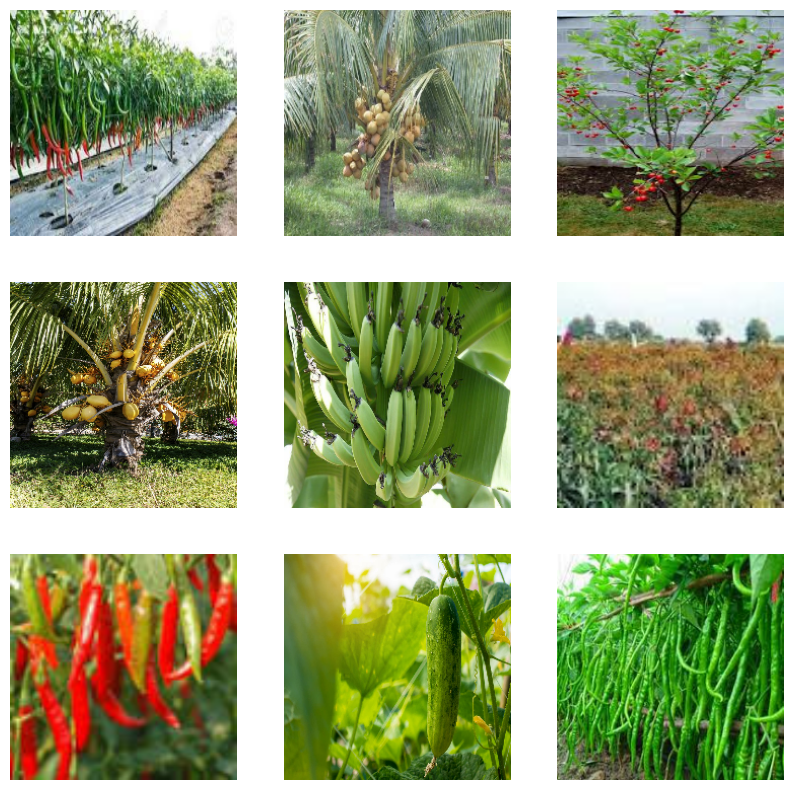

Epoch 1/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 13s 726ms/step - acc: 0.2212 - loss: 2.0378 - val_acc: 0.2963 - val_loss: 1.6247
Epoch 2/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 483ms/step - acc: 0.3782 - loss: 1.5227 - val_acc: 0.3704 - val_loss: 1.3658
Epoch 3/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 10s 450ms/step - acc: 0.4138 - loss: 1.4148 - val_acc: 0.4815 - val_loss: 1.1772
Epoch 4/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 706ms/step - acc: 0.6899 - loss: 0.9380 - val_acc: 0.5185 - val_loss: 1.0111
Epoch 5/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 453ms/step - acc: 0.6884 - loss: 0.8965 - val_acc: 0.6296 - val_loss: 0.8288
Epoch 6/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 649ms/step - acc: 0.7473 - loss: 0.7554 - val_acc: 0.6667 - val_loss: 0.7340
Epoch 7/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 454ms/step - acc: 0.7252 - loss: 0.8273 - val_acc: 0.8148 - val_loss: 0.6814
Epoch 8/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 630ms/step - acc: 0.8268 - loss: 0.5973 - val_acc: 0.8519 - val_loss: 0.6117


In [61]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# Define parameters
image_size = (224, 224)
batch_size = 10
num_classes = 5

def load_and_preprocess_data(base_folder):
    # Load dataset
    train_ds = tf.keras.utils.image_dataset_from_directory(
        base_folder,
        validation_split=0.2,
        subset="training",
        seed=1337,
        image_size=image_size,
        batch_size=batch_size,
    )
    val_ds = tf.keras.utils.image_dataset_from_directory(
        base_folder,
        validation_split=0.2,
        subset="validation",
        seed=1337,
        image_size=image_size,
        batch_size=batch_size,
    )

    # Prefetch datasets for performance optimization
    train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
    val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

    return train_ds, val_ds

def visualize_images(dataset):
    plt.figure(figsize=(10, 10))
    for images, _ in dataset.take(1):
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.axis("off")
    plt.show()

def make_transfer_model(input_shape, num_classes):
    # Load the pre-trained weights of MobileNetV2 and freeze the weights
    backbone = keras.applications.MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
    )
    backbone.trainable = False

    inputs = layers.Input(shape=input_shape)
    x = keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    return keras.Model(inputs, outputs, name="classifier")

# Create and compile the model with data augmentation
input_shape = image_size + (3,)
model_noaug = make_transfer_model(input_shape, num_classes)
model_noaug.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

base_folder = './agricultural_crops/subset_dataset'
train_ds, val_ds = load_and_preprocess_data(base_folder)

visualize_images(train_ds)

epochs = 8
history_noaug = model_noaug.fit(
    train_ds,
    epochs=epochs,
    validation_data=val_ds,
    callbacks=[keras.callbacks.ModelCheckpoint("model_noaug.keras")]
)

# Save the model
model_noaug.save("model_noaug.keras")


Found 135 files belonging to 5 classes.
Using 108 files for training.
Found 135 files belonging to 5 classes.
Using 27 files for validation.


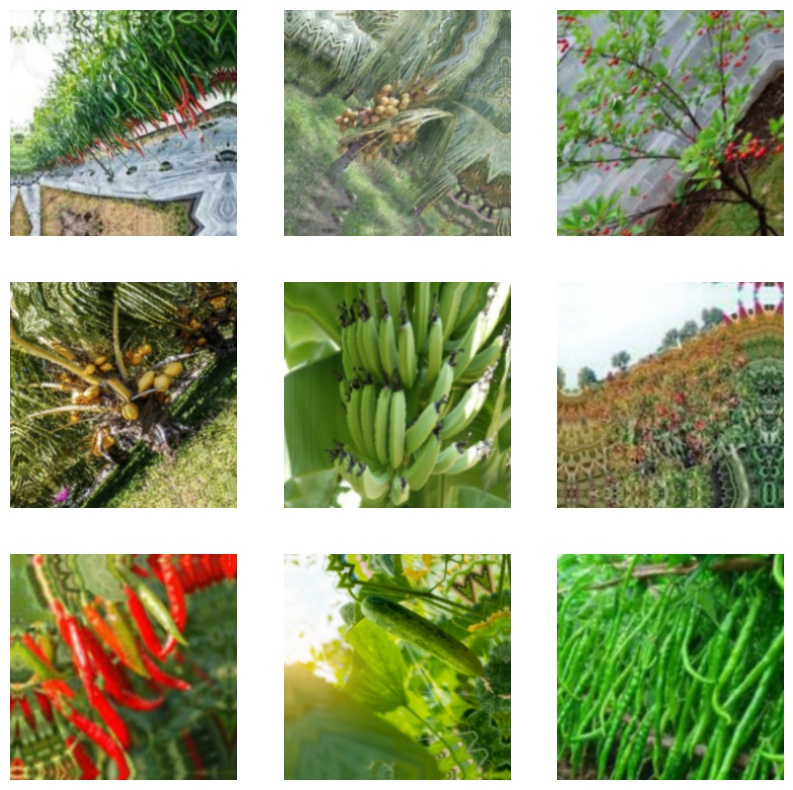

Epoch 1/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 16s 943ms/step - acc: 0.2512 - loss: 1.8313 - val_acc: 0.2963 - val_loss: 1.7557
Epoch 2/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 619ms/step - acc: 0.2696 - loss: 1.7155 - val_acc: 0.4074 - val_loss: 1.5284
Epoch 3/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 841ms/step - acc: 0.3956 - loss: 1.4167 - val_acc: 0.4074 - val_loss: 1.3159
Epoch 4/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - acc: 0.5380 - loss: 1.1915 - val_acc: 0.4444 - val_loss: 1.1503
Epoch 5/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 16s 592ms/step - acc: 0.5940 - loss: 1.1144 - val_acc: 0.5556 - val_loss: 1.0148
Epoch 6/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 788ms/step - acc: 0.6465 - loss: 0.8928 - val_acc: 0.6296 - val_loss: 0.9235
Epoch 7/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 861ms/step - acc: 0.7188 - loss: 0.7836 - val_acc: 0.7407 - val_loss: 0.8611
Epoch 8/8
11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 571ms/step - acc: 0.7591 - loss: 0.8112 - val_acc: 0.7037 - val_loss: 0.8160


In [59]:
image_size = (224, 224)
batch_size = 10
num_classes = 5

data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.15),
])

def load_and_preprocess_data(base_folder):
    train_ds = tf.keras.utils.image_dataset_from_directory(
        base_folder,
        validation_split=0.2,
        subset="training",
        seed=1337,
        image_size=image_size,
        batch_size=batch_size,
    )
    val_ds = tf.keras.utils.image_dataset_from_directory(
        base_folder,
        validation_split=0.2,
        subset="validation",
        seed=1337,
        image_size=image_size,
        batch_size=batch_size,
    )

    # Apply data augmentation to the training dataset
    train_ds = train_ds.map(
        lambda img, label: (data_augmentation(img, training=True), label),
        num_parallel_calls=tf.data.AUTOTUNE,
    )

    # Prefetch datasets for performance optimization
    train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
    val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

    return train_ds, val_ds

def visualize_augmented_images(dataset):
    plt.figure(figsize=(10, 10))
    for images, _ in dataset.take(1):
        augmented_images = data_augmentation(images, training=True)
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(augmented_images[i].numpy().astype("uint8"))
            plt.axis("off")
    plt.show()

def make_transfer_model(input_shape, num_classes):
    # Load the pre-trained weights of MobileNetV2 and freeze the weights
    backbone = keras.applications.MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
    )
    backbone.trainable = False

    inputs = layers.Input(shape=input_shape)
    x = keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    return keras.Model(inputs, outputs, name="classifier")

#compilation
input_shape = image_size + (3,)
model = make_transfer_model(input_shape, num_classes)
model.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

base_folder = './agricultural_crops/subset_dataset'
train_ds, val_ds = load_and_preprocess_data(base_folder)

#aaugmented images
visualize_augmented_images(train_ds)

#model training
epochs = 8
history = model.fit(
    train_ds,
    epochs=epochs,
    validation_data=val_ds,
    callbacks=[keras.callbacks.ModelCheckpoint("TrainBaseModelAugmentation.keras")]
)

#saving my model
model.save("TrainBaseModelAugmentation.keras")


#Compare Augmentation
Load the 2 models and compare the ROC curves with and without augmentation.


Found 135 files belonging to 5 classes.
Using 108 files for training.
Found 135 files belonging to 5 classes.
Using 27 files for validation.
Found 135 files belonging to 5 classes.
Using 27 files for validation.


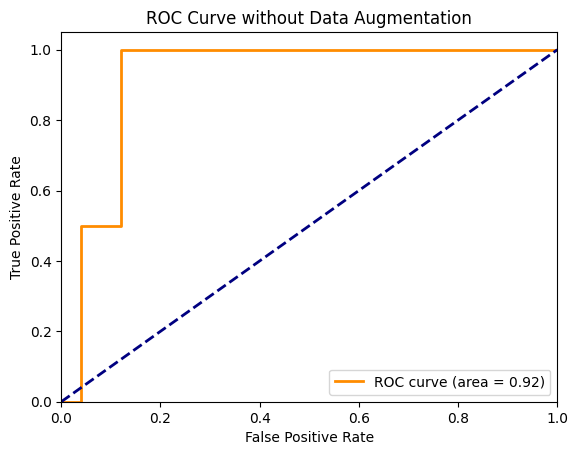

In [68]:
import numpy as np
from sklearn.metrics import roc_curve, auc


def get_predictions_and_labels(model, dataset):
    y_true = []
    y_pred = []
    for images, labels in dataset:
        predictions = model(images, training=False)
        y_true.extend(labels.numpy())
        y_pred.extend(tf.nn.softmax(predictions).numpy())
    return np.array(y_true), np.array(y_pred)

def plot_roc_curve(y_true, y_pred, title="ROC Curve"):
    fpr, tpr, _ = roc_curve(y_true, y_pred[:, 1], pos_label=1)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.legend(loc='lower right')
    plt.show()

# Load and preprocess data
base_folder = './agricultural_crops/subset_dataset'
train_ds = load_and_preprocess_data(base_folder, subset="training")
val_ds = load_and_preprocess_data(base_folder, subset="validation")

# Create and compile the model without data augmentation
input_shape = image_size + (3,)
model_noaug = make_transfer_model(input_shape, num_classes)
model_noaug.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

# Load the test data (if available) or use the validation data
test_ds = load_and_preprocess_data(base_folder, subset="validation")

# Get predictions and labels
y_true, y_pred_without_aug = get_predictions_and_labels(model_noaug, test_ds)

# Visualize the ROC curve
plot_roc_curve(y_true, y_pred_without_aug, title="ROC Curve without Data Augmentation")


Found 135 files belonging to 5 classes.
Using 108 files for training.
Found 135 files belonging to 5 classes.
Using 27 files for validation.
Found 135 files belonging to 5 classes.
Using 108 files for training.
Found 135 files belonging to 5 classes.
Using 27 files for validation.
Found 135 files belonging to 5 classes.
Using 27 files for validation.
Found 135 files belonging to 5 classes.
Using 27 files for validation.


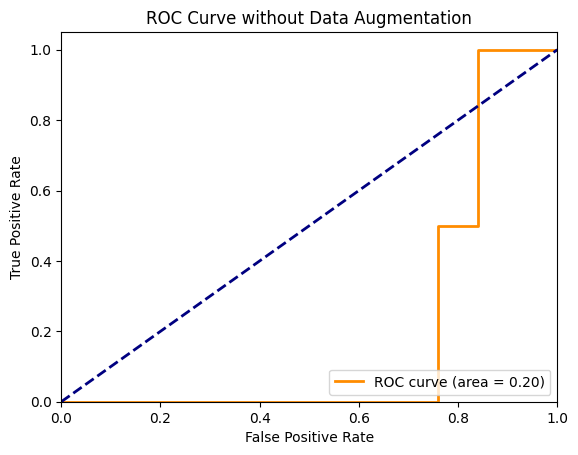

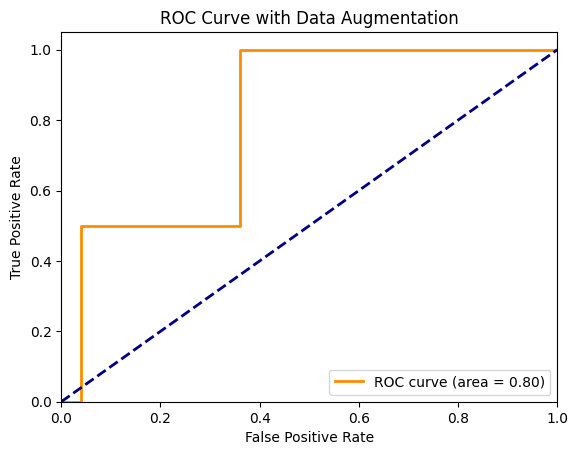

In [80]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import roc_curve, auc

# Define parameters
image_size = (224, 224)
batch_size = 20
num_classes = 2

# Define data augmentation layers
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

def load_and_preprocess_data(base_folder, subset=None, use_augmentation=False):
    # Load dataset
    dataset = tf.keras.utils.image_dataset_from_directory(
        base_folder,
        validation_split=0.2,
        subset=subset,
        seed=1337,
        image_size=image_size,
        batch_size=batch_size,
    )

    # Apply data augmentation if specified
    if use_augmentation and subset == "training":
        dataset = dataset.map(
            lambda img, label: (data_augmentation(img, training=True), label),
            num_parallel_calls=tf.data.AUTOTUNE,
        )

    # Prefetch datasets for performance optimization
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

def make_transfer_model(input_shape, num_classes):
    # Load the pre-trained weights of MobileNetV2 and freeze the weights
    backbone = keras.applications.MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
    )
    backbone.trainable = False

    inputs = layers.Input(shape=input_shape)
    x = keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    return keras.Model(inputs, outputs, name="classifier")

def get_predictions_and_labels(model, dataset):
    y_true = []
    y_pred = []
    for images, labels in dataset:
        predictions = model(images, training=False)
        y_true.extend(labels.numpy())
        y_pred.extend(tf.nn.softmax(predictions).numpy())
    return np.array(y_true), np.array(y_pred)

def plot_roc_curve(y_true, y_pred, title="ROC Curve"):
    fpr, tpr, _ = roc_curve(y_true, y_pred[:, 1], pos_label=1)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.legend(loc='lower right')
    plt.show()

# Load and preprocess data
base_folder = './agricultural_crops/subset_dataset'

# Load and preprocess datasets
train_ds_noaug = load_and_preprocess_data(base_folder, subset="training", use_augmentation=False)
val_ds_noaug = load_and_preprocess_data(base_folder, subset="validation", use_augmentation=False)
train_ds_aug = load_and_preprocess_data(base_folder, subset="training", use_augmentation=True)
val_ds_aug = load_and_preprocess_data(base_folder, subset="validation", use_augmentation=True)

# Create and compile the models
input_shape = image_size + (3,)

# Model without data augmentation
model_noaug = make_transfer_model(input_shape, num_classes)
model_noaug.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

# Model with data augmentation
model_aug = make_transfer_model(input_shape, num_classes)
model_aug.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

# Train models (assuming you have trained and saved these models separately)
# For demonstration purposes, we assume the models are already trained.

# Load the test data (if available) or use the validation data
test_ds_noaug = load_and_preprocess_data(base_folder, subset="validation", use_augmentation=False)
test_ds_aug = load_and_preprocess_data(base_folder, subset="validation", use_augmentation=True)

# Get predictions and labels
y_true_noaug, y_pred_noaug = get_predictions_and_labels(model_noaug, test_ds_noaug)
y_true_aug, y_pred_aug = get_predictions_and_labels(model_aug, test_ds_aug)

# Plot ROC curves
plot_roc_curve(y_true_noaug, y_pred_noaug, title="ROC Curve without Data Augmentation")
plot_roc_curve(y_true_aug, y_pred_aug, title="ROC Curve with Data Augmentation")


Found 135 files belonging to 5 classes.
Using 108 files for training.
Found 135 files belonging to 5 classes.
Using 27 files for validation.
Found 135 files belonging to 5 classes.
Using 108 files for training.
Found 135 files belonging to 5 classes.
Using 27 files for validation.


Found 135 files belonging to 5 classes.
Using 27 files for validation.
Found 135 files belonging to 5 classes.
Using 27 files for validation.


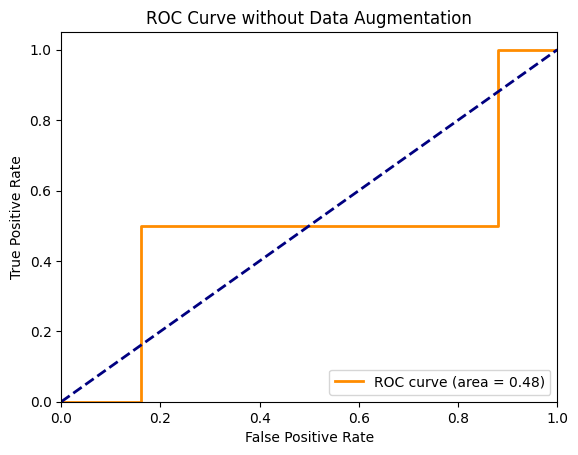

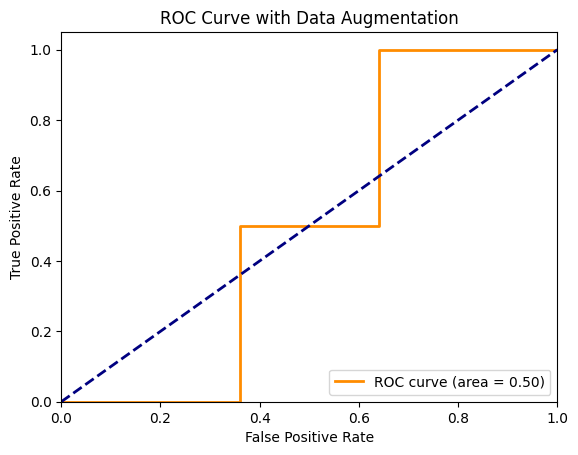

In [85]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import roc_curve, auc

# Define parameters
image_size = (224, 224)
batch_size = 20
num_classes = 2

# Define data augmentation layers
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

def load_and_preprocess_data(base_folder, subset=None, use_augmentation=False):
    # Load dataset
    dataset = tf.keras.utils.image_dataset_from_directory(
        base_folder,
        validation_split=0.2,
        subset=subset,
        seed=1337,
        image_size=image_size,
        batch_size=batch_size,
    )

    # Apply data augmentation if specified
    if use_augmentation and subset == "training":
        dataset = dataset.map(
            lambda img, label: (data_augmentation(img, training=True), label),
            num_parallel_calls=tf.data.AUTOTUNE,
        )

    # Prefetch datasets for performance optimization
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

def make_transfer_model(input_shape, num_classes):
    # Load the pre-trained weights of MobileNetV2 and freeze the weights
    backbone = keras.applications.MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
    )
    backbone.trainable = False

    inputs = layers.Input(shape=input_shape)
    x = keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    return keras.Model(inputs, outputs, name="classifier")

def get_predictions_and_labels(model, dataset):
    y_true = []
    y_pred = []
    for images, labels in dataset:
        predictions = model(images, training=False)
        y_true.extend(labels.numpy())
        y_pred.extend(tf.nn.softmax(predictions).numpy())
    return np.array(y_true), np.array(y_pred)

def plot_roc_curve(y_true, y_pred, title="ROC Curve"):
    fpr, tpr, _ = roc_curve(y_true, y_pred[:, 1], pos_label=1)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.legend(loc='lower right')
    plt.show()

# Load and preprocess data
base_folder = './agricultural_crops/subset_dataset'

# Load and preprocess datasets
train_ds_noaug = load_and_preprocess_data(base_folder, subset="training", use_augmentation=False)
val_ds_noaug = load_and_preprocess_data(base_folder, subset="validation", use_augmentation=False)
train_ds_aug = load_and_preprocess_data(base_folder, subset="training", use_augmentation=True)
val_ds_aug = load_and_preprocess_data(base_folder, subset="validation", use_augmentation=True)

# Create and compile the models
input_shape = image_size + (3,)

# Model without data augmentation
model_noaug = make_transfer_model(input_shape, num_classes)
model_noaug.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

# Model with data augmentation
model_aug = make_transfer_model(input_shape, num_classes)
model_aug.compile(
    optimizer=keras.optimizers.Adam(3e-4),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

model_noaug.save('model_noaug.h5')
model_aug.save('model_aug.h5')

test_ds_noaug = load_and_preprocess_data(base_folder, subset="validation", use_augmentation=False)
test_ds_aug = load_and_preprocess_data(base_folder, subset="validation", use_augmentation=True)

# Get predictions and labels
y_true_noaug, y_pred_noaug = get_predictions_and_labels(model_noaug, test_ds_noaug)
y_true_aug, y_pred_aug = get_predictions_and_labels(model_aug, test_ds_aug)

# Plot ROC curves
plot_roc_curve(y_true_noaug, y_pred_noaug, title="ROC Curve without Data Augmentation")
plot_roc_curve(y_true_aug, y_pred_aug, title="ROC Curve with Data Augmentation")


In [89]:
# Save models in native Keras format (.keras)
model_noaug.save('model_noaug.keras')
model_aug.save('model_aug.keras')
